# Package Imports

In [1]:
import pandas as pd

import numpy as np
import os, sys

# pvlib imports
import pvlib

from pvlib.pvsystem import PVSystem

from pvlib.location import Location

from pvlib.modelchain import ModelChain
from pvlib.temperature import TEMPERATURE_MODEL_PARAMETERS

from timeseries_functions import timeseries_plotter, timesteplen_calculator, cleaner_per_day, remove_duplicate_index
from dtw import *

import plotly.express as px
import seaborn as sns
import h5py


Importing the dtw module. When using in academic works please cite:
  T. Giorgino. Computing and Visualizing Dynamic Time Warping Alignments in R: The dtw Package.
  J. Stat. Soft., doi:10.18637/jss.v031.i07.



In [2]:


def physical_profile(row):

    "Pass a dataset for PV Meta Data: Location, Tilt, Azimuth, Capacity and a Dataset for irradiance: DNI, DHI, GHI to calculate profiles with PV Watts"
    
    index, latitude, longitude, tilt, azimuth, capacity = row

    temperature_model_parameters = TEMPERATURE_MODEL_PARAMETERS['sapm']['open_rack_glass_glass']

    location = Location(latitude=latitude, longitude=longitude)

    pvwatts_system = PVSystem(surface_tilt= tilt , surface_azimuth=azimuth,
        module_parameters={'pdc0': capacity, 'gamma_pdc': -0.004},
        inverter_parameters={'pdc0': capacity},
        temperature_model_parameters=temperature_model_parameters)
    
    mc = ModelChain(pvwatts_system, location, aoi_model='physical', spectral_model='no_loss')
    mc.run_model(df_irr)
    results = mc.results.ac

    df_results = pd.Series(results)
    df_results.index = df_results.index.tz_localize(None)
    df_results.index.name = "timestamp"

    return df_results

In [3]:
os.getcwd()

'/Users/nikolaushouben/Library/Mobile Documents/com~apple~CloudDocs/PhD_Icloud/PhD_Research/Paper_2_Collaborative Forecasting/Code/Collaborative_PV_Forecasting'

# Data Imports

In [4]:
df_power = pd.read_csv("../../Input_Data/PV_System_Power.csv", index_col=0, parse_dates=True)

In [5]:
original_timesteplen = round(timesteplen_calculator(df_power),10)
original_timestep = round(original_timesteplen/10)*10
selected_systems= df_power.columns
target_timesteplen = "15T"
df_power = df_power.resample(target_timesteplen).mean()
df_power.columns = [int(col) for col in df_power.columns]

In [8]:
df_meta = pd.read_csv("../../Data/System/PV system information dataset TU WIEN.csv", sep = ";", index_col=0)
df_meta = df_meta.iloc[:,1:]
df_meta["tilt"] = df_meta["tilt"].str.replace(",",".")
df_meta["azimuth"] = df_meta["azimuth"].str.replace(",",".")
df_meta = df_meta.astype("float")
total_cap = df_meta["estimated capacity"].sum() / 10**6
df_meta_infer = pd.read_csv("../../Input_Data/Meta_Data_PV_Optimised.csv", index_col=0)
df_meta["tilt"] = df_meta_infer["tilt_finetuned"]
df_meta["azimuth"] = df_meta_infer["azimuth_finetuned"]
selected_systems = [int(index) for index in selected_systems]
df_meta = df_meta.loc[selected_systems,:]


In [10]:
df_irr = pd.read_csv("../../Data/Meteo/GHI_DNI_DHI.csv", index_col=0, parse_dates=True)
df_irr = df_irr.iloc[:,2:]
print(df_irr.columns)
df_irr.columns = ["dhi", "dni", "ghi"]
df_irr = df_irr.resample(target_timesteplen).mean()
df_irr = df_irr.tz_localize(None)

Index(['Dhi', 'Dni', 'Ghi'], dtype='object')


In [11]:
first_timestep = df_irr.index[0]
last_timestep = df_irr.index[-1]
df_power = df_power[first_timestep:last_timestep]

In [12]:
def entsoe_data_manipulation(df, technology= "Price"): #ist ausbaufähig ;) 

    index_name = df.index.name

    cols = [string for string in df.columns if technology in string] 
    df = df[cols].reset_index()
    df[["timestamp"]] = df[index_name].str.split("-", expand= True)[0]
    df.index = pd.DatetimeIndex(df["timestamp"])
    df = df.drop([index_name, "timestamp"], axis = 1)
    return df

df_price_2015 = pd.read_csv("../../Data/Price/Imbalance_201501010000-201601010000.csv", index_col=0)
df_price_2016 = pd.read_csv("../../Data/Price/Imbalance_201601010000-201701010000.csv", index_col=0)
df_price_2015 = entsoe_data_manipulation(df_price_2015, "Price")
df_price_2016 = entsoe_data_manipulation(df_price_2016, "Price")
df_price = pd.concat([df_price_2015, df_price_2016],axis = 0)
df_price.columns = [col[0] for col in df_price.columns]
df_price = remove_duplicate_index(df_price, df_price.index.name)
df_price = df_price.astype("int")

# Best Case (Full Information)

In [67]:
df_full_info = df_meta.reset_index().apply(physical_profile, axis=1).transpose()
df_full_info.columns = df_meta.index

In [68]:
def error_calc(df_phys, df_measured, timesteplen, unit):

    "Input physical and measured timeseries of PV in Watts"
    
    df_copy = df_phys.copy()
    for column in df_phys:
        df_copy[column] -= df_measured[column]
   
    df_copy.dropna(inplace=True)

    df_errors_per_system = abs(df_copy).sum(0)

    df_errors_total = df_copy.sum(axis=1)

    if unit == "W":
        df_errors_total = pd.DataFrame(df_errors_total, columns=["error"])
        df_errors_total *= (60/int(timesteplen[:-1])) #from W to Wh
        df_errors_total /= 10**6 #from Wh to MWh
    else:
        raise ValueError("Unit should be in Watts")

    return df_errors_total, df_errors_per_system

In [69]:
df_errors_total, df_errors_per_system = error_calc(df_full_info, df_power, target_timesteplen, "W")

df_errors_per_system_total_information = pd.DataFrame(df_errors_per_system, columns=["total info"])

In [70]:
df_errors_total

,error
timestamp,
2015-01-01 00:00:00,0.0
2015-01-01 00:15:00,0.0
2015-01-01 00:30:00,0.0
2015-01-01 00:45:00,0.0
2015-01-01 01:00:00,0.0
...,...
2015-12-23 22:45:00,0.0
2015-12-23 23:00:00,0.0
2015-12-23 23:15:00,0.0


In [316]:
df_prices = df_price.resample("15T").mean()

In [317]:
fig = px.line(df_prices)
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [277]:
def economic_cost_calculator(df_price, df_errors, total_cap):

    #Single Imbalance Pricing Scenario#
    
    #df_merged = pd.merge(df_price, abs(df_errors), left_index=True, right_index=True)
    #df_merged["cost"] = df_merged["+"] * df_merged["error"]
    #df_cost = df_merged[["cost"]]

    #Dual Imbalance Pricing Scenario: The real case in The Netherlands#

    df_merged = pd.merge(df_price, df_errors, left_index=True, right_index=True)
    df_merged_pos = df_merged.loc[df_merged["error"] > 0][["error", "+"]].apply(np.prod, axis = 1)
    df_cost_pos = pd.DataFrame(df_merged_pos, columns=["cost"])
    df_merged_neg = df_merged.loc[df_merged["error"] < 0][["error", "-"]].apply(np.prod, axis = 1)
    df_cost_neg = pd.DataFrame(df_merged_neg, columns=["cost"])
    df_cost = pd.concat([df_cost_pos, df_cost_neg], axis = 0).reindex(df_merged.index).dropna()

    
    total_cost = (df_cost.sum(axis = 0) / total_cap)

    print("The total cost is {0} €/(MWp*a)".format(total_cost))

    return df_merged, df_cost, total_cost

In [301]:
df_merged, df_cost_full_info, total_cost = economic_cost_calculator(df_price, df_errors_total, total_cap)

The total cost is cost    41210.981999
dtype: float64 €/(MWp*a)


In [302]:
print("The best-case scenario, in which both tilt and azimuth are perfectly known gives a yearly cost of: {0} €/MWp".format(round(total_cost[0])))

The best-case scenario, in which both tilt and azimuth are perfectly known gives a yearly cost of: 41211 €/MWp


In [303]:
cost_known = round(total_cost[0])

### Plotting some of the imbalances with their prices:

In [280]:


df_merged[df_merged.columns] = scaler.fit_transform(df_merged[df_merged.columns])

In [281]:
df_price.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 69212 entries, 2015-01-01 00:00:00 to 2016-12-31 23:45:00
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   +       69212 non-null  int64
 1   -       69212 non-null  int64
dtypes: int64(2)
memory usage: 3.6 MB


Text(0.5, 0, 'Hour')

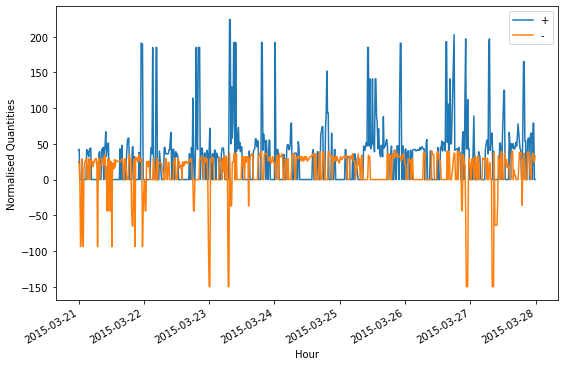

In [304]:


ax = df_merged.loc["2015-03-21":"2015-03-27"][["+", "-"]].plot(figsize= (9,6))
ax.set_ylabel("Normalised Quantities")
ax.set_xlabel("Hour")

<AxesSubplot:xlabel='timestamp'>

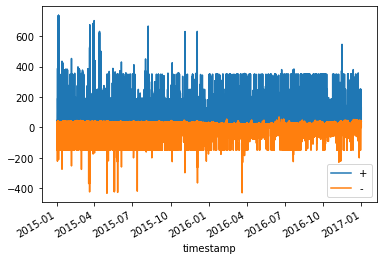

In [305]:
df_price.plot()

In [ ]:
timeseries_plotter(df_merged,10)

In [81]:
df_price.describe()

,+,-
count,69212.000000,69212.000000
mean,38.278680,6.948506
std,62.897429,32.543088
min,0.000000,-433.000000
25%,0.000000,0.000000
50%,26.000000,13.000000
75%,44.000000,25.000000
max,737.000000,69.000000


# Case A (No Tilt)

### Checking if Tilt makes a difference

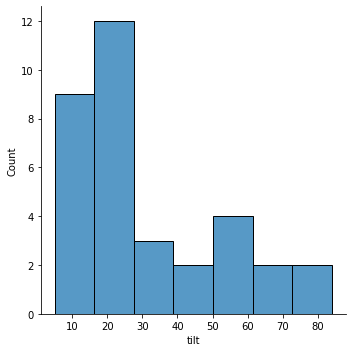

In [53]:
sns.displot(df_meta["tilt"])

None uniform distribution of tilts


- > Hypothesis: Guessing the tilt has a major impact on the accuracy of the physical modelling

### Cost Calculation

-> Assumption of a uniform distribution of tilts (just guessing randomly)

In [259]:
num_of_systems = df_meta.shape[0]
iters = 500


In [260]:
df_meta_tilts = df_meta.copy()

costs_tilts = []

for i in range(iters):
    tilts = np.random.uniform(0,91, (num_of_systems,1))
    df_meta_tilts["tilt"] = tilts
    print(df_meta_tilts["tilt"].mean())
    df_phys = df_meta_tilts.reset_index().apply(physical_profile, axis=1).transpose()
    df_phys.columns = df_meta_tilts.index
    df_errors, df_errors_per = error_calc(df_phys, df_power, target_timesteplen, "W")
    merged,_, total_cost = economic_cost_calculator(df_price, df_errors, total_cap)

    costs_tilts.append(np.squeeze(total_cost))

44.71902945832216
The total cost is cost    72846.864261
dtype: float64 €/(MWp*a)
44.027136099208576
The total cost is cost    80390.133404
dtype: float64 €/(MWp*a)
42.654492578162824
The total cost is cost    67877.151004
dtype: float64 €/(MWp*a)
45.224617069192476
The total cost is cost    74515.52284
dtype: float64 €/(MWp*a)
46.664535343964154
The total cost is cost    67048.140504
dtype: float64 €/(MWp*a)
42.633572395858494
The total cost is cost    66570.881464
dtype: float64 €/(MWp*a)
43.75336759932299
The total cost is cost    73190.384289
dtype: float64 €/(MWp*a)
46.44600832331228
The total cost is cost    76085.882732
dtype: float64 €/(MWp*a)
45.236886217581414
The total cost is cost    72196.797587
dtype: float64 €/(MWp*a)
51.03698149517107
The total cost is cost    69992.921708
dtype: float64 €/(MWp*a)
54.20211699148137
The total cost is cost    72311.143166
dtype: float64 €/(MWp*a)
41.49592177672274
The total cost is cost    77384.429373
dtype: float64 €/(MWp*a)
47.11078939

In [261]:
average_cost_tilts = round(np.array(costs_tilts).mean())

print(" The cost of forecast errors when guessing the tilt angle of all systems (drawing from a uniform distribution is):\n {} €/MWp.\n This is {} € more than when everything is known.".format(average_cost_tilts, (average_cost_tilts-cost_known)))

 The cost of forecast errors when guessing the tilt angle of all systems (drawing from a uniform distribution is):
 71014 €/MWp.
 This is 6147 € more than when everything is known.


# Case B (No Azimuth)

In [262]:


df_meta_azimuths = df_meta.copy()

costs_azis = []

for i in range(iters):
    
    azimuths = np.random.uniform(0,361, (num_of_systems,1))
    df_meta_azimuths["azimuth"] = azimuths
    print(df_meta_azimuths["azimuth"].mean())
    df_phys = df_meta_azimuths.reset_index().apply(physical_profile, axis=1).transpose()
    df_phys.columns = df_meta_azimuths.index
    df_errors, df_errors_per = error_calc(df_phys, df_power, target_timesteplen, "W")
    merged,_, total_cost = economic_cost_calculator(df_price, df_errors, total_cap)

    costs_azis.append(np.squeeze(total_cost))


180.6763017875148
The total cost is cost    77959.724672
dtype: float64 €/(MWp*a)
166.1845539023114
The total cost is cost    70704.396149
dtype: float64 €/(MWp*a)
195.98714053216705
The total cost is cost    67135.473317
dtype: float64 €/(MWp*a)
182.70377712436252
The total cost is cost    73593.006576
dtype: float64 €/(MWp*a)
173.90493940658632
The total cost is cost    76509.419723
dtype: float64 €/(MWp*a)
214.3510604849891
The total cost is cost    90972.70421
dtype: float64 €/(MWp*a)
167.75903382169724
The total cost is cost    71455.857294
dtype: float64 €/(MWp*a)
203.12439185052764
The total cost is cost    79285.816342
dtype: float64 €/(MWp*a)
173.97557253839972
The total cost is cost    97588.608268
dtype: float64 €/(MWp*a)
160.9040520532751
The total cost is cost    83670.207037
dtype: float64 €/(MWp*a)
162.98429543419994
The total cost is cost    69020.021453
dtype: float64 €/(MWp*a)
189.57311114052774
The total cost is cost    92687.342947
dtype: float64 €/(MWp*a)
214.23748

In [263]:
average_cost_azis = round(np.array(costs_azis).mean())

print(" The cost of forecast errors when guessing the azimuth angle of all systems (drawing from a uniform distribution is):\n {} €/MWp.\n This is {} € more than when everything is known.".format(average_cost_azis, (average_cost_azis-cost_known)))

 The cost of forecast errors when guessing the azimuth angle of all systems (drawing from a uniform distribution is):
 79678 €/MWp.
 This is 14811 € more than when everything is known.


# Case C (No Azimuth and Tilt)

In [264]:
df_meta_unknown = df_meta.copy()

costs_unknown = []

for i in range(iters):

    tilt_azimuth_combinations = (np.random.randint(0,91, (num_of_systems,1)), np.random.randint(0,361, (num_of_systems,1)))
    df_meta_unknown["azimuth"] = tilt_azimuth_combinations[1]
    df_meta_unknown["tilt"] = tilt_azimuth_combinations[0]
    print(df_meta_unknown["azimuth"].mean())
    print(df_meta_unknown["tilt"].mean())
    df_phys = df_meta_unknown.reset_index().apply(physical_profile, axis=1).transpose()
    df_phys.columns = df_meta_unknown.index
    df_errors, df_errors_per = error_calc(df_phys, df_power, target_timesteplen, "W")
    merged,_, total_cost = economic_cost_calculator(df_price, df_errors, total_cap)

    costs_unknown.append(np.squeeze(total_cost))


193.85294117647058
45.294117647058826
The total cost is cost    103032.788886
dtype: float64 €/(MWp*a)
197.1764705882353
46.1764705882353
The total cost is cost    95622.431169
dtype: float64 €/(MWp*a)
175.02941176470588
45.794117647058826
The total cost is cost    97743.951336
dtype: float64 €/(MWp*a)
223.1764705882353
38.705882352941174
The total cost is cost    101977.598078
dtype: float64 €/(MWp*a)
199.11764705882354
42.85294117647059
The total cost is cost    88704.643595
dtype: float64 €/(MWp*a)
189.0
53.911764705882355
The total cost is cost    93944.062713
dtype: float64 €/(MWp*a)
145.7941176470588
45.6764705882353
The total cost is cost    102627.283408
dtype: float64 €/(MWp*a)
198.41176470588235
47.11764705882353
The total cost is cost    78506.633302
dtype: float64 €/(MWp*a)
187.5
43.911764705882355
The total cost is cost    84076.349508
dtype: float64 €/(MWp*a)
176.41176470588235
47.23529411764706
The total cost is cost    84230.799502
dtype: float64 €/(MWp*a)
147.617647058

In [265]:
average_cost_unkown = round(np.array(costs_unknown).mean())

print(" The cost of forecast errors when guessing the tilt and azimuth angle of all systems (drawing from a uniform distribution is):\n {} €/MWp.\n This is {} € more than when everything is known.".format(average_cost_unkown, (average_cost_unkown-cost_known)))

 The cost of forecast errors when guessing the tilt and azimuth angle of all systems (drawing from a uniform distribution is):
 92945 €/MWp.
 This is 28078 € more than when everything is known.


# Plotting

In [266]:
df_results = pd.DataFrame({"Both Known": cost_known, "Tilt Unknown": costs_tilts, "Azimuth Unknown": costs_azis, "Both Unknown": costs_unknown})
df_results = pd.DataFrame(df_results.unstack(level = 0)).reset_index()
df_results.columns = ["label", "index", "Costs"]

In [271]:
errors = np.squeeze(df_results.groupby("label").std().iloc[:,-1:].sort_values("Costs").values).tolist()
errors[0] = 1000
mean = np.squeeze(df_results.groupby("label").mean().iloc[:,-1:].sort_values("Costs").values).tolist()
labels = df_results.groupby("label").mean().sort_values("Costs").index.tolist()

label
Azimuth Unknown    14811.358431
Both Known             0.000000
Both Unknown       28077.784832
Tilt Unknown        6147.454467
Name: Costs, dtype: float64

64867.0

In [273]:
os.chdir("../../Graphics")

In [274]:
os.getcwd()

'/Users/nikolaushouben/Library/Mobile Documents/com~apple~CloudDocs/PhD_Icloud/PhD_Research/Paper_2_Collaborative Forecasting/Graphics'

## Absolute

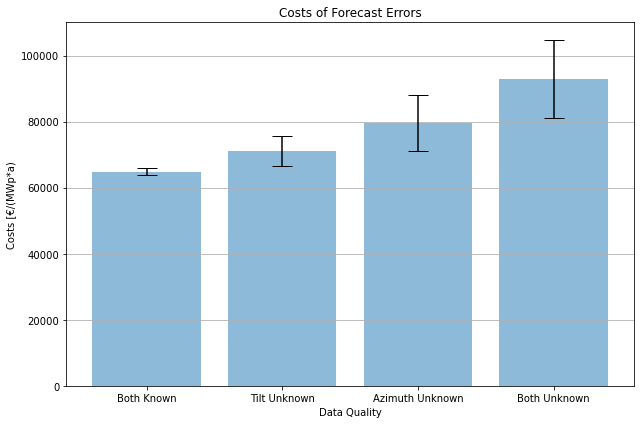

In [275]:
import matplotlib.pyplot as plt


x_pos = range(len(labels))
# Build the plot
fig, ax = plt.subplots(figsize= (9,6))
ax.bar(x_pos, mean, yerr=errors, align='center', alpha=0.5, ecolor='black', capsize=10)
ax.set_ylabel('Costs [€/(MWp*a)')
ax.set_xlabel('Data Quality')
ax.set_xticks(x_pos)
ax.set_xticklabels(labels)
ax.set_title('Costs of Forecast Errors')
ax.yaxis.grid(True)
# Save the figure and show
plt.tight_layout()
plt.savefig('costs_of_forecasts.png')
plt.show()

## Relative

In [332]:
df_results_relative = df_results.groupby("label").mean()["Costs"] -df_results.groupby("label").mean().loc["Both Known"][1]

In [351]:
mean = df_results_relative.sort_values().values[1:].tolist()
labels_1 = labels[1:]
x_pos = len(mean)
errors = [0,0,0]
colors = ["gray", "blue", "orange"]

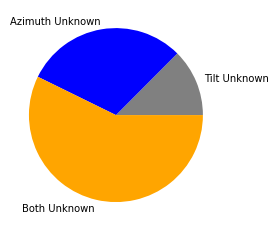

In [352]:

plt.pie(mean, labels = labels_1, colors=colors)
plt.show() 

# Shadow Finder

In [14]:


df_full_info = df_meta.reset_index().apply(physical_profile, axis=1).transpose()
df_full_info.columns = df_meta.index
system_id = df_full_info.columns[12]
measured = df_power[system_id]
measured.name = "measured " + str(system_id)
modelled = df_full_info[system_id]
modelled.name = "modelled"
df_compare = pd.merge(measured, modelled, left_index=True, right_index=True)

154

In [57]:
fig = px.line(df_compare)
fig.update_xaxes(rangeslider_visible=True)
fig.show()